In [54]:
import numpy as np
from scipy import *
from pylab import *
import os
import pickle
from scipy.spatial import KDTree
import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [76]:
folder_HMF = '/pscratch/sd/j/jialiu/CAMELS/Rockstar/' ### original, unorganized halo catalogue from rockstar
home = '/global/homes/j/jialiu/cosmo_dep_feedback/'
folder_plot = home+'plots/'

cmap = matplotlib.cm.get_cmap('Spectral') # ('spring')#('viridis')#
labels=[r'$\Omega_m$', r'$\sigma_8$', r'$\log_{10}(A_{\rm SN1})$', 
        r'$\log_{10}(A_{\rm AGN1})$', r'$\log_{10}(A_{\rm SN2})$', r'$\log_{10}(A_{\rm AGN2})$']
labels_plain = ['om','si8', 'Asn1', 'Aagn1', 'Asn2', 'Aagn2']

fields = ['Mvir', 'Rvir', 'Cvir', 'c2a',]# 'd']
fields_tex = ['P_m', 'P_c', 'P_g', 'HMF', 'M_{vir}', 'R_{vir}', 'C_{vir}', '1-e',]
        
        
Mmin, Mmax = 8.9, 12.1
rmin, rmax = 0.5, 1.5 #0, 3
k0, k1 =  0.5, 25##0.12, 25

In [10]:
### fixed parameters: 
Omega_b = 0.049
h = 0.6711
ns = 0.9624
w = -1
mnu = 0.0 #eV
Omega_k = 0.0

fidu_params = [ 0.3, 0.8 ,0. ,  0. ,0. ,0.]
iz = 0
iset = '1P'
isim = 'IllustrisTNG'

###########
kmax=30
k=np.load(home+'Pk/IllustrisTNG_k_m_z=0.00.npy')
Nk=sum(k<kmax)
kcut=k[:Nk]


############
mbins = linspace(8,16, 17)
dmbin = mbins[1]-mbins[0]
mbins_center = mbins[:-1]+0.5*dmbin

######## all CAMELS sims
sim_arr = ['IllustrisTNG',  'SIMBA', 'Astrid'] ## seems like Astrid files are there, but naming system is different

######### the redshift we're interested in
# zarr=[0.00, ]
zarr= [0.00, 1.05, 2.00, 3.00]

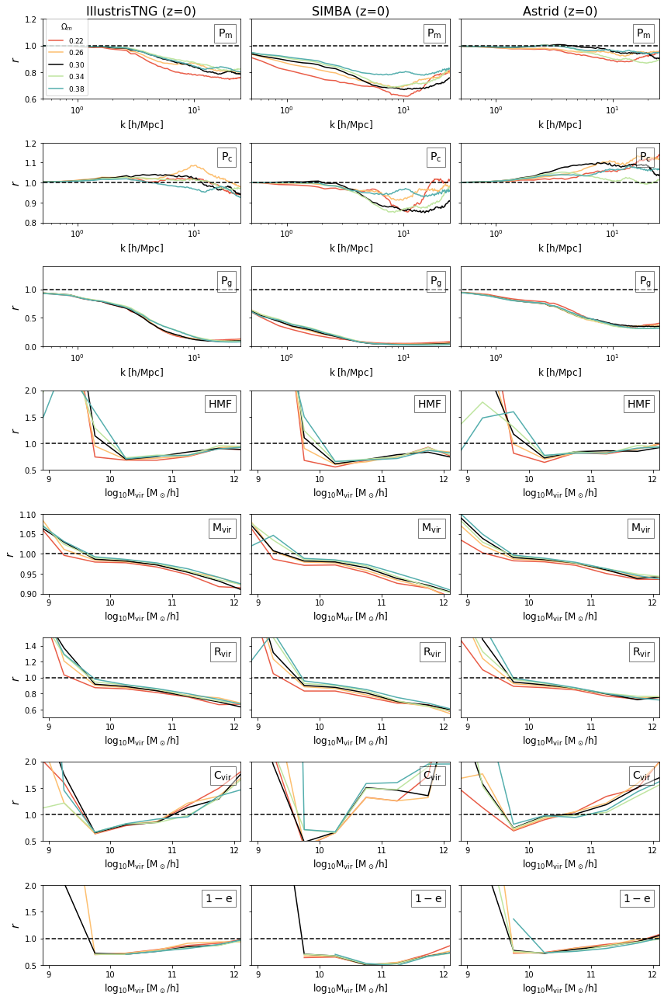

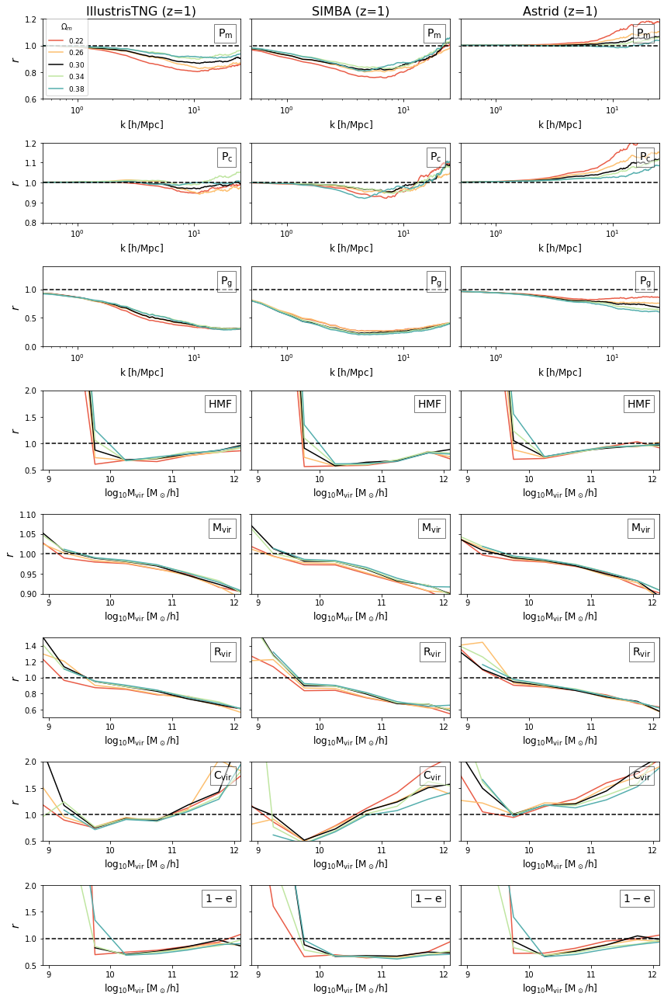

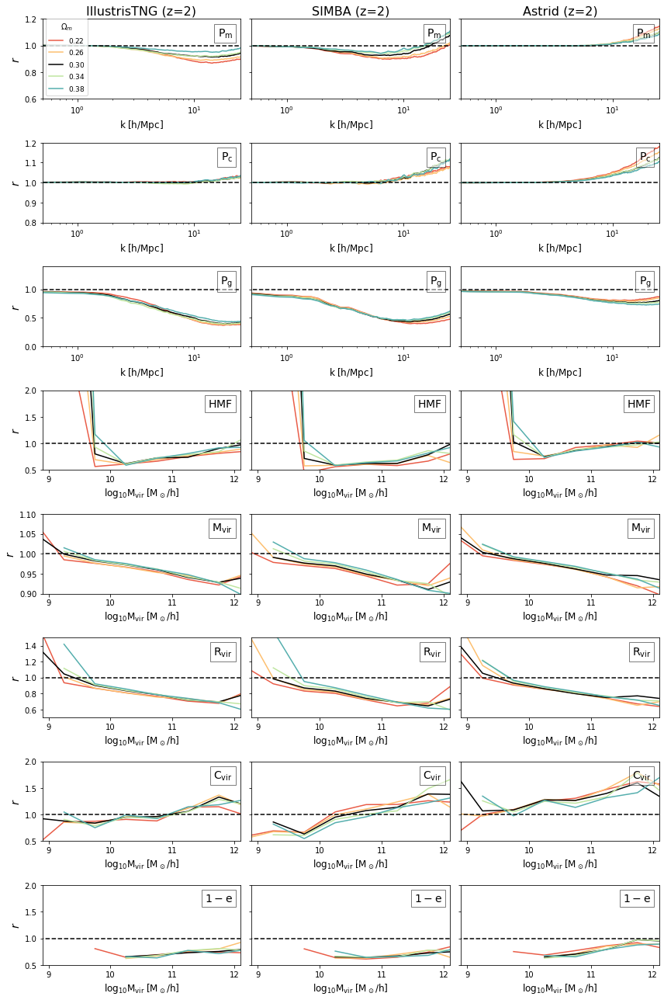

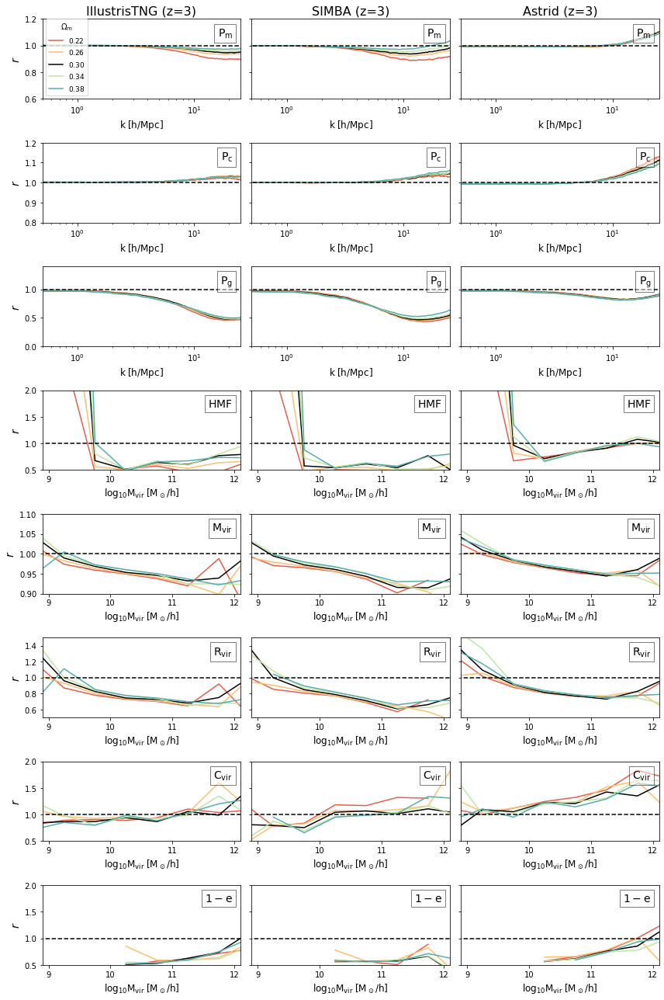

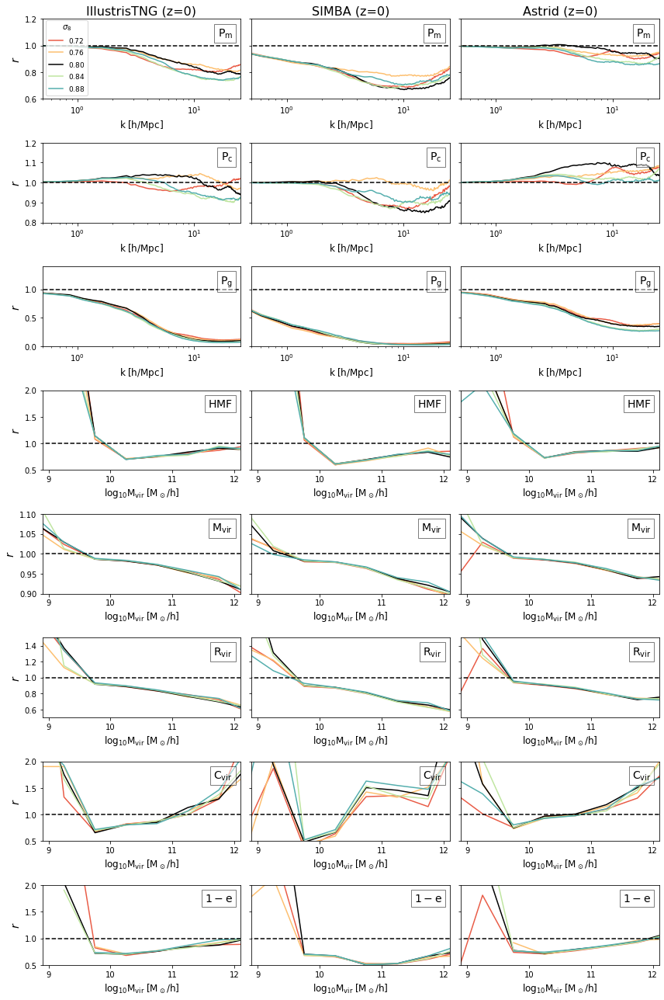

...

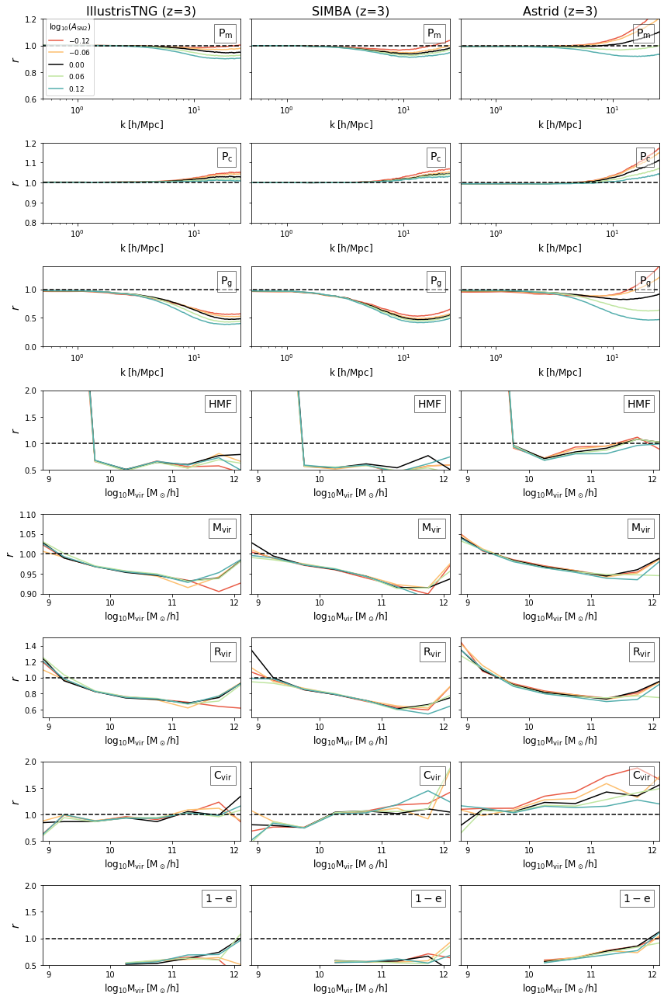

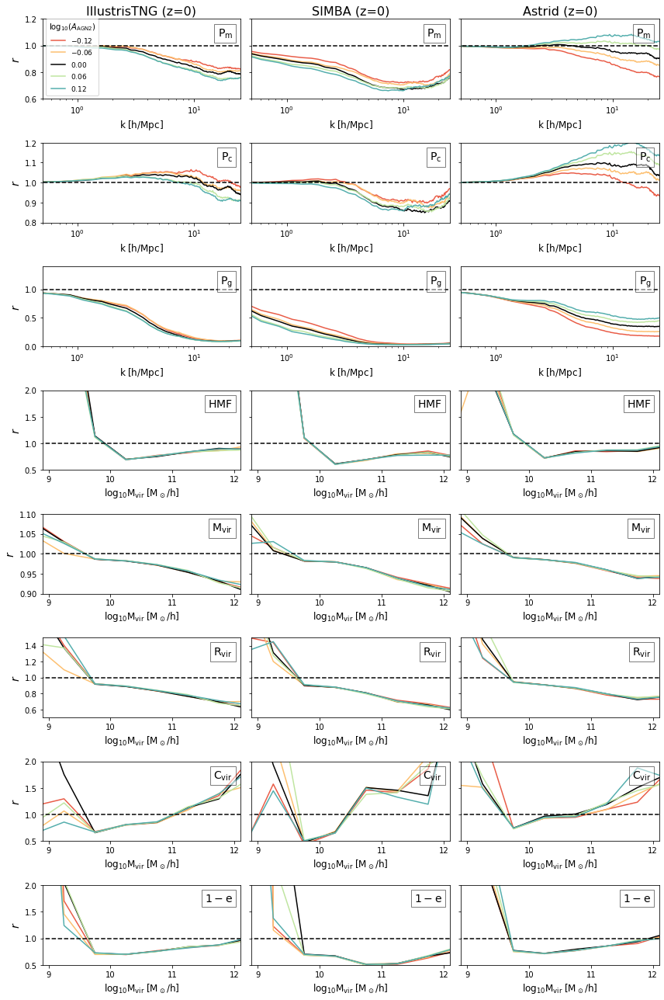

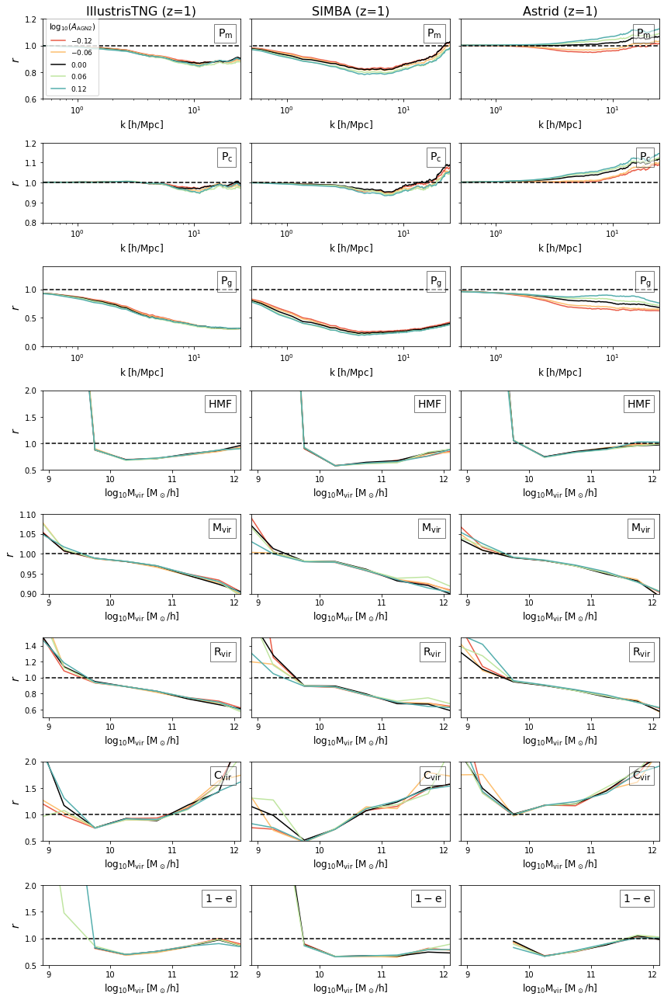

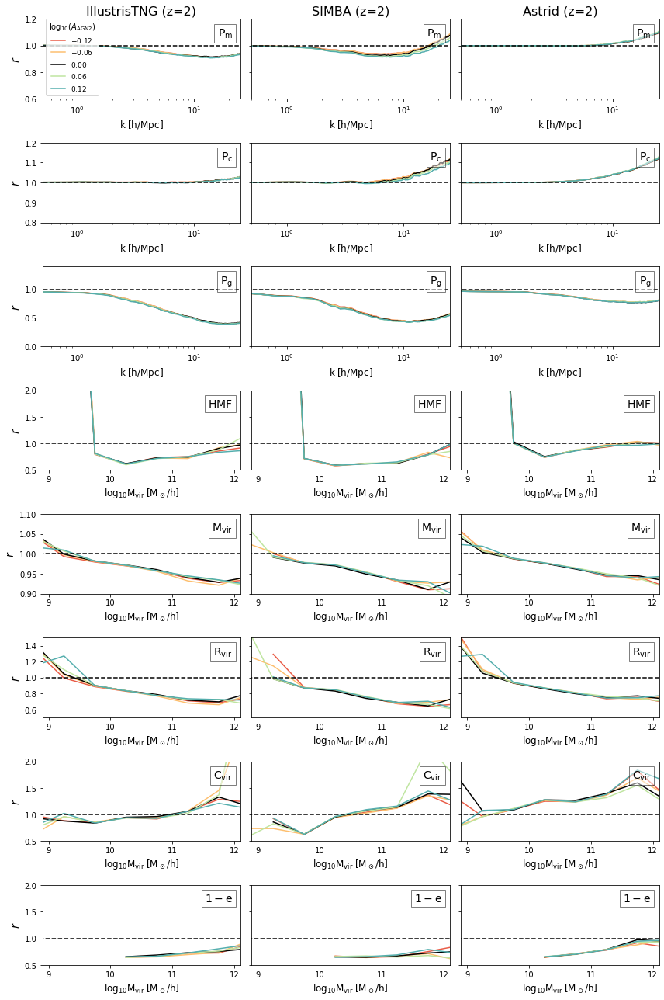

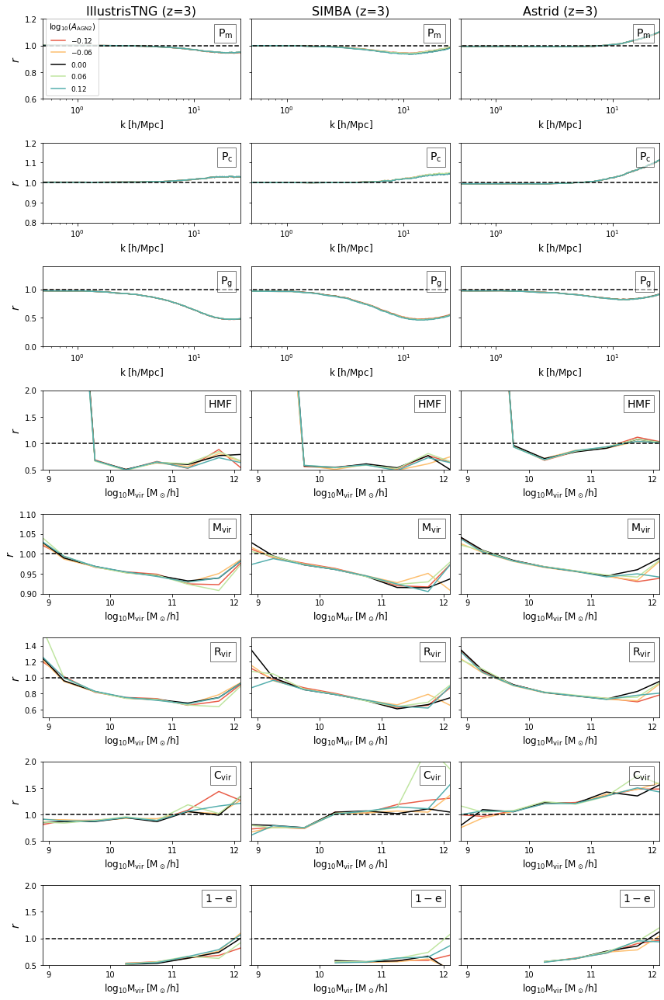

In [94]:
########## ratio plot for all quantities (3 x Pk related, 5 x halo related, 8 rows x 3 columns plot) z=0
######### only omega m for now

i=1 ### 0: omega_m 
iz=0
yranges=[[0.6, 1.2], [0.8, 1.2], [0, 1.4], [0.5, 2], [0.9, 1.1], [0.5, 1.5], [0.5, 2], [0.5, 2]]

for i in range(6):
    for iz in zarr:
        
# for i in [0,]: 
#     for iz in [0,]:

        f, ax=subplots(8, 3, figsize=(12,18))

        j=-1
        for isim in sim_arr:
            j+=1 ### simulation counter
            params = np.load(home+'Pk/%s_%s_%s_z=%.2f_DM.npy'%(isim, 'Pk_m', iset, iz))[:, :6]

            Pk_DM_arr = np.load(home+'Pk/%s_%s_%s_z=%.2f_DM.npy'%(isim, 'Pk_m', iset, iz))[:, 6:]
            Pk_hydro_arr = np.load(home+'Pk/%s_%s_%s_z=%.2f.npy'%(isim, 'Pk_m', iset, iz))[:, 6:]
            Pk_c_arr = np.load(home+'Pk/%s_%s_%s_z=%.2f.npy'%(isim, 'Pk_c', iset, iz))[:, 6:]
            Pk_g_arr = np.load(home+'Pk/%s_%s_%s_z=%.2f.npy'%(isim, 'Pk_g', iset, iz))[:, 6:]

            hmf_arr = np.load(home+'halos/%s_%s_z=%.2f.npy'%(isim, iset, iz))[:, 6:]
            hmf_DM_arr = np.load(home+'halos/%s_%s_z=%.2f_DM.npy'%(isim, iset, iz))[:, 6:]

            r_Pm = Pk_hydro_arr/Pk_DM_arr
            r_Pc = Pk_c_arr/Pk_DM_arr
            r_Pg = Pk_g_arr/Pk_DM_arr
            r_hmf = hmf_arr/hmf_DM_arr

            Mvir_arr = np.load(home+'halos/%s_binned_z=%.2f_mean_ratio_%s.npy'%(isim, iz, 'Mvir'))[:, 6:]
            Rvir_arr = np.load(home+'halos/%s_binned_z=%.2f_mean_ratio_%s.npy'%(isim, iz, 'Rvir'))[:, 6:]
            Cvir_arr = np.load(home+'halos/%s_binned_z=%.2f_mean_ratio_%s.npy'%(isim, iz, 'Cvir'))[:, 6:]
            e_arr = np.load(home+'halos/%s_binned_z=%.2f_mean_ratio_%s.npy'%(isim, iz, 'c2a'))[:, 6:]

            idx = where(params[:,i]!=fidu_params[i])[0] # select the varying one on specific parameter
            idx = concatenate([idx[:5], [0,], idx[5:]]) ## inserting the fiducial model in the middle
            idx_select = idx[3:-3]

            ic=-1
            colors=cmap(linspace(0,1,len(idx_select)+2))[1:-1]
            for iidx in idx_select:
                ic+=1
                icolor=colors[ic]
                iparam=params[iidx,i]
                if iparam==fidu_params[i]:
                    icolor='k'
                ax[0][j].plot(kcut, r_Pm[iidx].flatten(), color=icolor, label='$%.2f$'%(iparam))
                ax[1][j].plot(kcut, r_Pc[iidx].flatten(), color=icolor, label='$%.2f$'%(iparam))
                ax[2][j].plot(kcut, r_Pg[iidx].flatten(), color=icolor, label='$%.2f$'%(iparam))
                ax[3][j].plot(mbins_center, r_hmf[iidx].flatten(), color=icolor, label='$%.2f$'%(iparam))
                ax[4][j].plot(mbins_center, Mvir_arr[iidx].flatten(), color=icolor, label='$%.2f$'%(iparam))
                ax[5][j].plot(mbins_center, Rvir_arr[iidx].flatten(), color=icolor, label='$%.2f$'%(iparam))
                ax[6][j].plot(mbins_center, Cvir_arr[iidx].flatten(), color=icolor, label='$%.2f$'%(iparam))
                ax[7][j].plot(mbins_center, e_arr[iidx].flatten(), color=icolor, label='$%.2f$'%(iparam))

            for ii in range(3):
                rmin,rmax=yranges[ii]
                ax[ii][j].plot(kcut, ones(len(kcut)), 'k--')
                ax[ii][j].set_xlim(k0,k1)
                ax[ii][j].set_xscale('log')
                ax[ii][j].set_ylim(rmin, rmax)
                ax[ii][j].set_xlabel(r'$\rm k \;[h/Mpc]$',fontsize=12)
                ax[ii][j].text(0.96,0.9, r'$\rm %s$'%(fields_tex[ii]),transform=ax[ii][j].transAxes, 
                               horizontalalignment='right',verticalalignment='top',
                               bbox=dict(facecolor='w', alpha=0.5), fontsize=14)

            for ii in range(3,8):
                rmin, rmax=yranges[ii]
                ax[ii][j].plot(mbins_center, ones(len(mbins_center)), 'k--')
                ax[ii][j].set_xlim(Mmin,Mmax)
                ax[ii][j].set_ylim(rmin, rmax)
                ax[ii][j].set_xlabel(r'$\rm log_{10} M_{vir} \;[M_\odot/h]$',fontsize=12)
                ax[ii][j].locator_params(axis='x', nbins=4)
                ax[ii][j].text(0.96,0.9, r'$\rm %s$'%(fields_tex[ii]),transform=ax[ii][j].transAxes, 
                               horizontalalignment='right',verticalalignment='top',
                               bbox=dict(facecolor='w', alpha=0.5), fontsize=14)
            ax[0][j].set_title('%s (z=%.0f)'%(isim,iz), fontsize=16)        

        for ii in range(8):
            # ax[ii][0].set_ylabel(r'$r \rm {(%s)}$' % (fields_tex[ii]),fontsize=14)
            ax[ii][0].set_ylabel(r'$r$',fontsize=14)
            ax[ii][1].yaxis.set_ticklabels([])
            ax[ii][2].yaxis.set_ticklabels([])

        ax[0][0].legend(title='%s'%(labels[i]),ncol=1,fontsize=9,loc='lower left')
        plt.subplots_adjust(hspace=0, wspace=0)
        plt.tight_layout()
        f.savefig(folder_plot+'all_ratio_%s_z%.2f.pdf'%(labels_plain[i], iz))
        show()

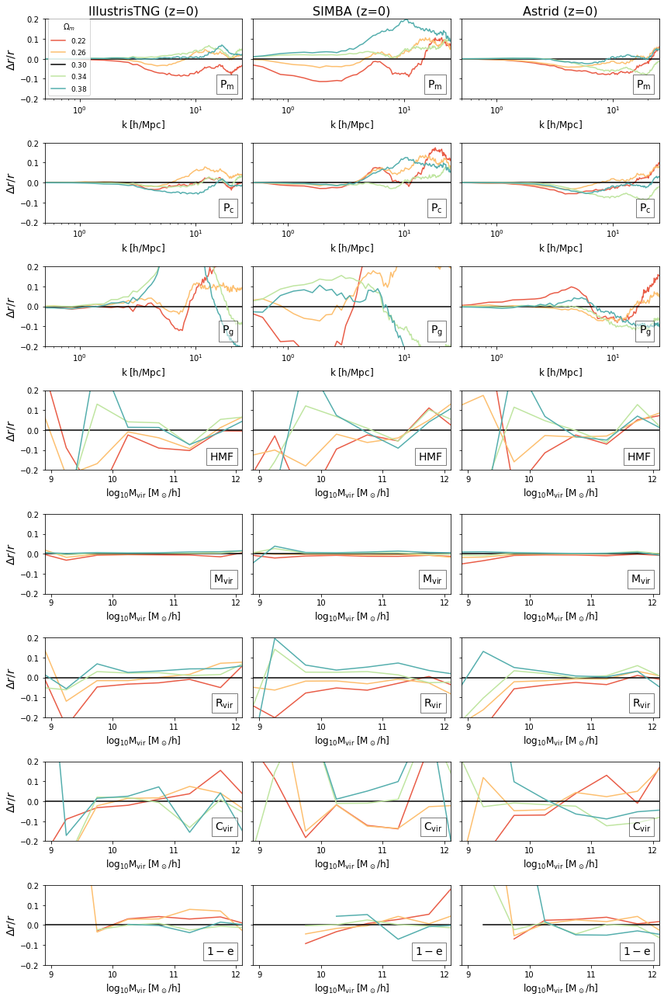

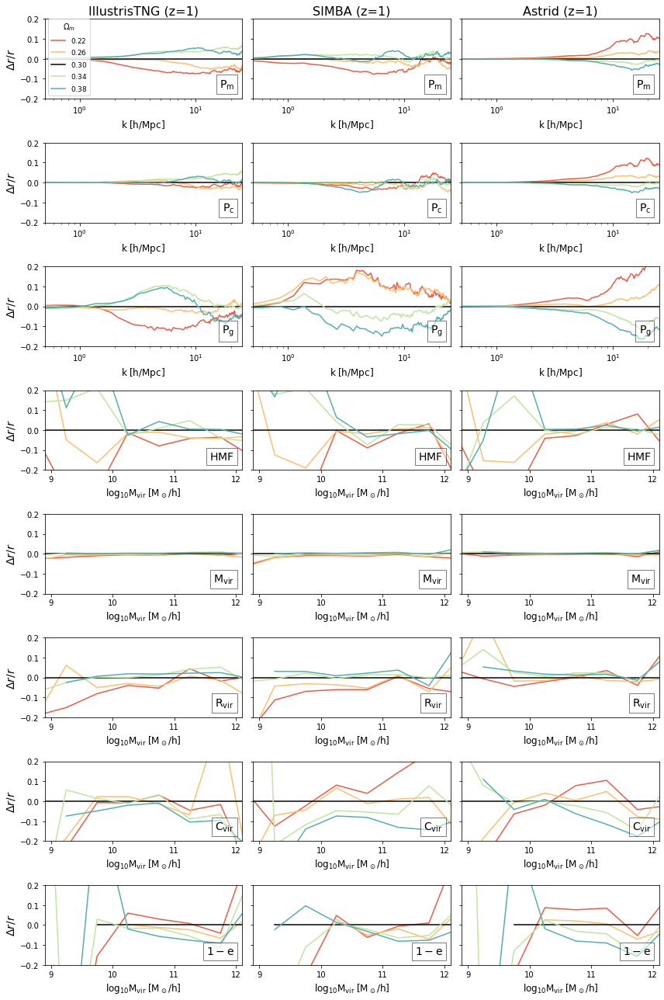

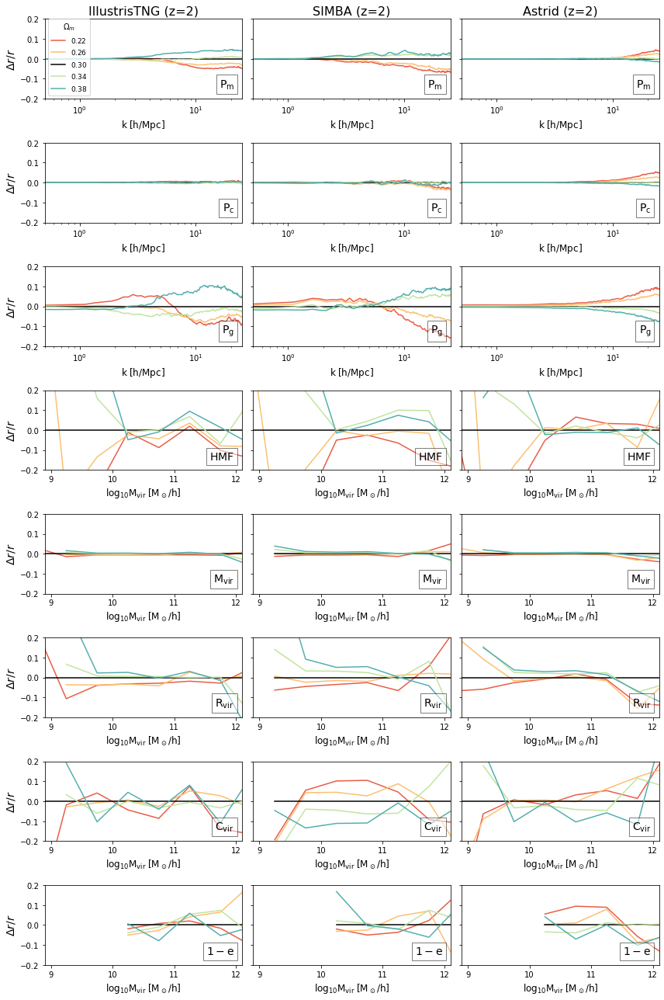

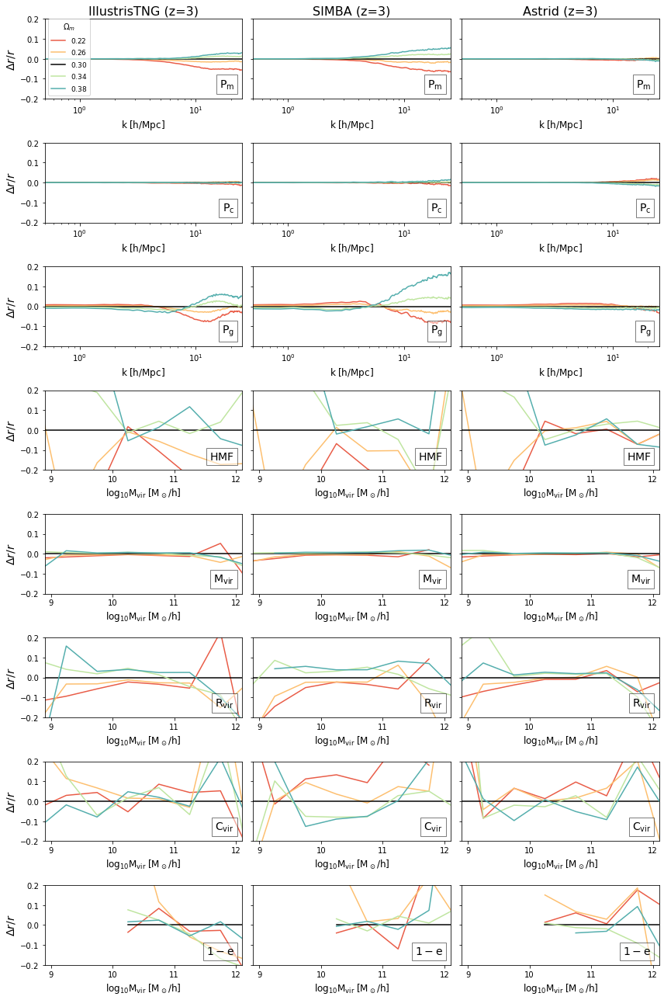

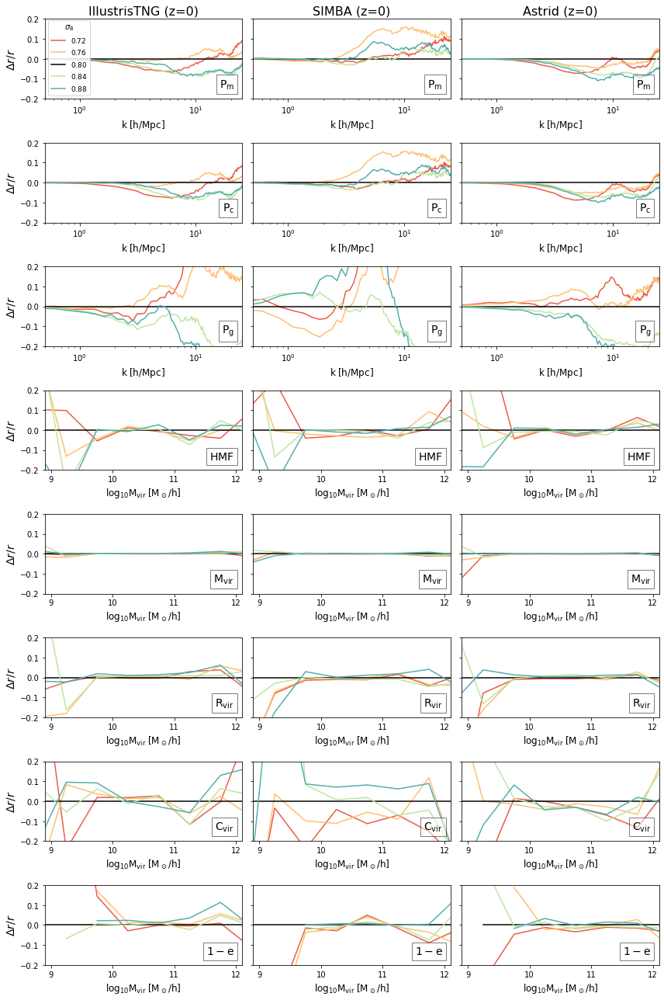

...

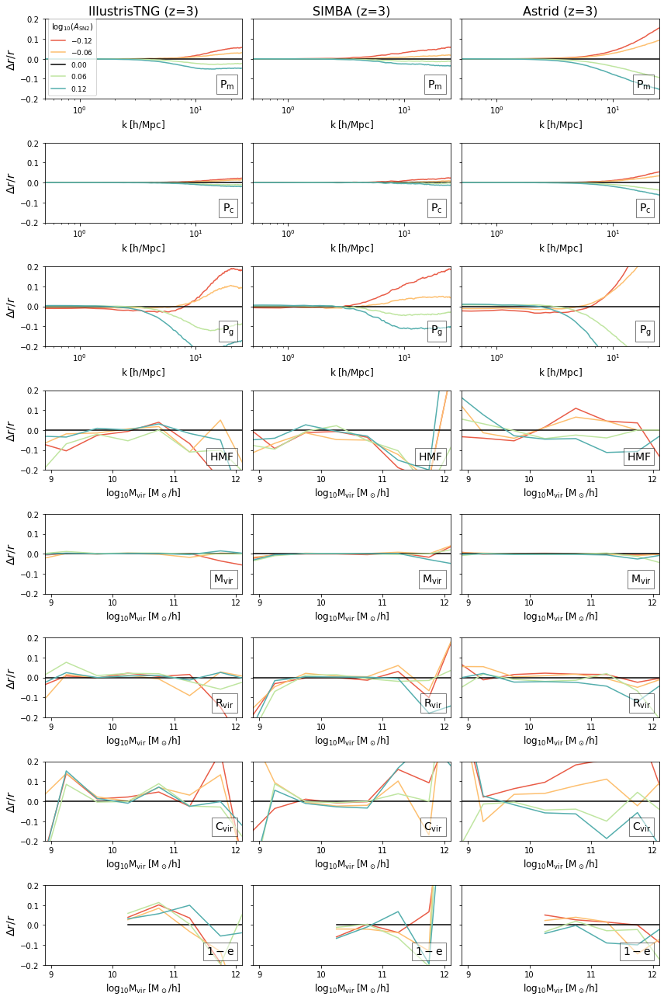

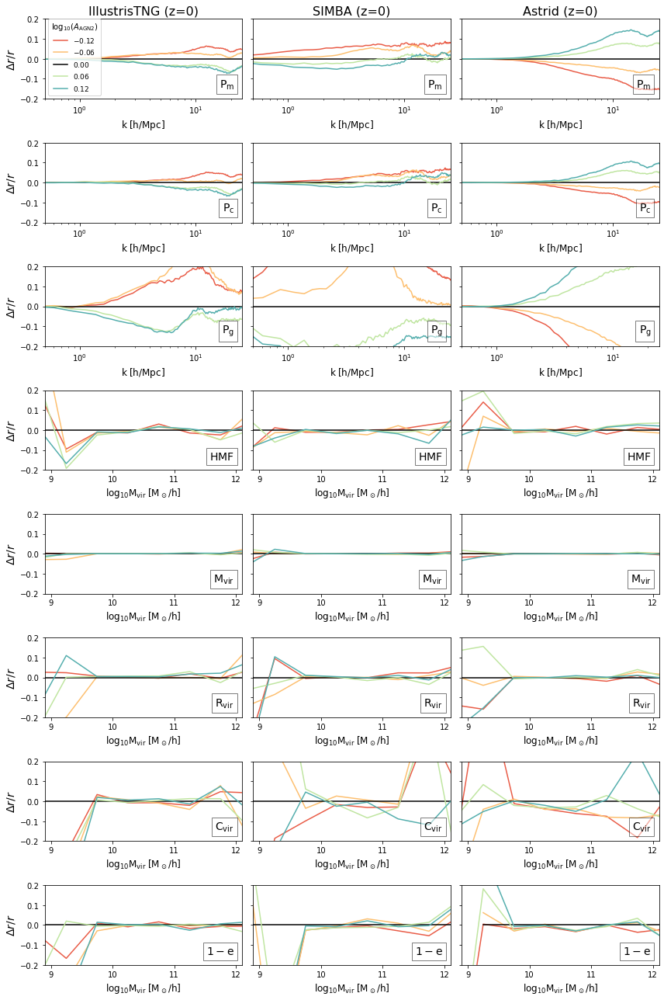

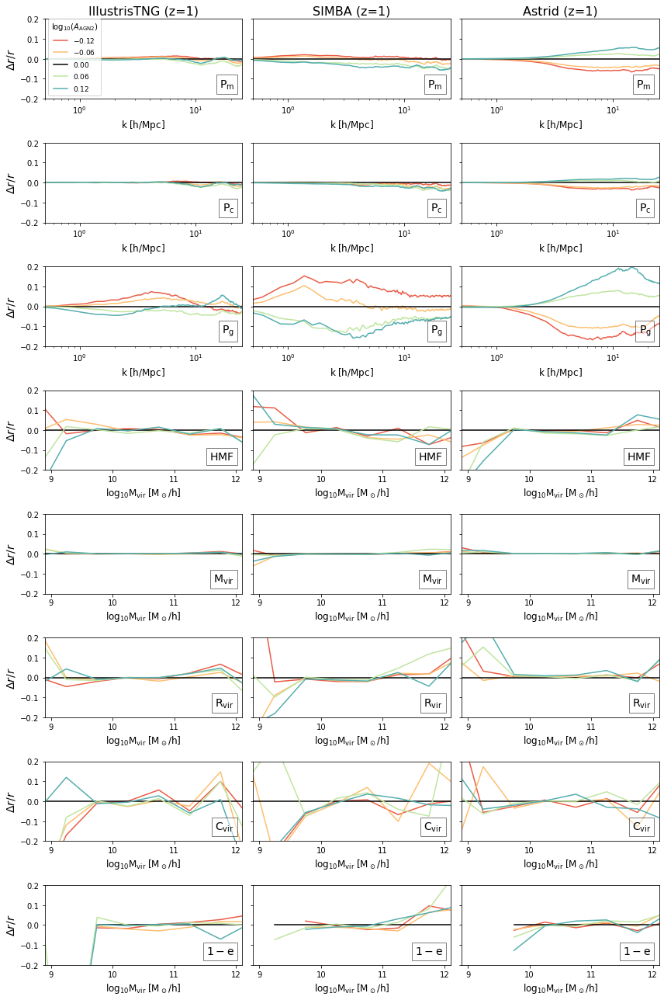

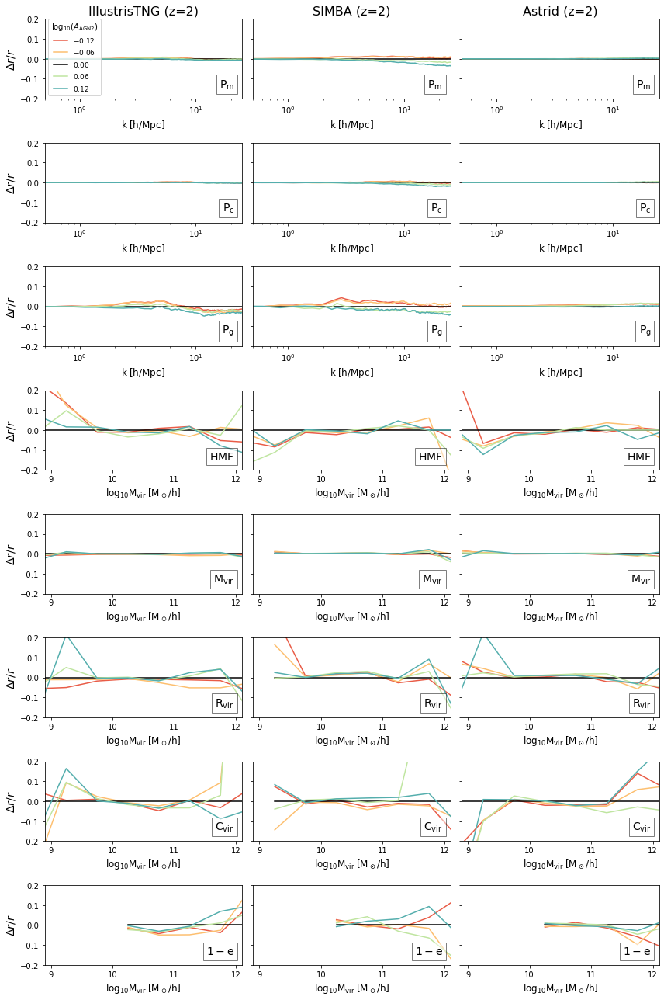

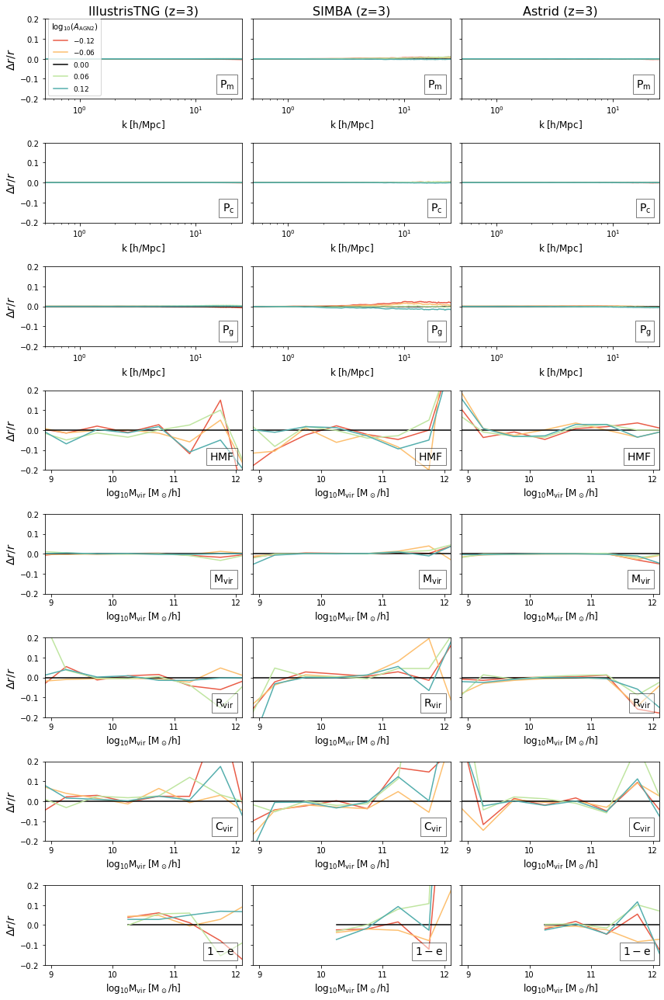

In [90]:
########## ratio plot for all quantities (3 x Pk related, 5 x halo related, 8 rows x 3 columns plot) z=0
######### only omega m for now


yranges=[[-0.2, 0.2],]*8
for i in range(6):
    for iz in zarr:
        
# for i in [0,]: 
#     for iz in [0,]:
        
        f, ax=subplots(8, 3, figsize=(12,18))

        j=-1
        for isim in sim_arr:
            j+=1 ### simulation counter
            params = np.load(home+'Pk/%s_%s_%s_z=%.2f_DM.npy'%(isim, 'Pk_m', iset, iz))[:, :6]

            Pk_DM_arr = np.load(home+'Pk/%s_%s_%s_z=%.2f_DM.npy'%(isim, 'Pk_m', iset, iz))[:, 6:]
            Pk_hydro_arr = np.load(home+'Pk/%s_%s_%s_z=%.2f.npy'%(isim, 'Pk_m', iset, iz))[:, 6:]
            Pk_c_arr = np.load(home+'Pk/%s_%s_%s_z=%.2f.npy'%(isim, 'Pk_c', iset, iz))[:, 6:]
            Pk_g_arr = np.load(home+'Pk/%s_%s_%s_z=%.2f.npy'%(isim, 'Pk_g', iset, iz))[:, 6:]

            hmf_arr = np.load(home+'halos/%s_%s_z=%.2f.npy'%(isim, iset, iz))[:, 6:]
            hmf_DM_arr = np.load(home+'halos/%s_%s_z=%.2f_DM.npy'%(isim, iset, iz))[:, 6:]

            r_Pm = Pk_hydro_arr/Pk_DM_arr
            r_Pc = Pk_c_arr/Pk_DM_arr
            r_Pg = Pk_g_arr/Pk_DM_arr
            r_hmf = hmf_arr/hmf_DM_arr

            Mvir_arr = np.load(home+'halos/%s_binned_z=%.2f_mean_ratio_%s.npy'%(isim, iz, 'Mvir'))[:, 6:]
            Rvir_arr = np.load(home+'halos/%s_binned_z=%.2f_mean_ratio_%s.npy'%(isim, iz, 'Rvir'))[:, 6:]
            Cvir_arr = np.load(home+'halos/%s_binned_z=%.2f_mean_ratio_%s.npy'%(isim, iz, 'Cvir'))[:, 6:]
            e_arr = np.load(home+'halos/%s_binned_z=%.2f_mean_ratio_%s.npy'%(isim, iz, 'c2a'))[:, 6:]

            idx = where(params[:,i]!=fidu_params[i])[0] # select the varying one on specific parameter
            idx = concatenate([idx[:5], [0,], idx[5:]]) ## inserting the fiducial model in the middle
            idx_select = idx[3:-3]
            # idx_lo = idx[4]
            # idx_fi = [0,]
            # idx_hi = idx[5]

            ic=-1
            colors=cmap(linspace(0,1,len(idx_select)+2))[1:-1]
            for iidx in idx_select:
                ic+=1
                icolor=colors[ic]
                iparam=params[iidx,i]
                if iparam==fidu_params[i]:
                    icolor='k'
                ax[0][j].plot(kcut, r_Pm[iidx].flatten()/r_Pm[0].flatten()-1, color=icolor, label='$%.2f$'%(iparam))
                ax[1][j].plot(kcut, r_Pc[iidx].flatten()/r_Pc[0].flatten()-1, color=icolor, label='$%.2f$'%(iparam))
                ax[2][j].plot(kcut, r_Pg[iidx].flatten()/r_Pg[0].flatten()-1, color=icolor, label='$%.2f$'%(iparam))
                ax[3][j].plot(mbins_center, r_hmf[iidx].flatten()/r_hmf[0].flatten()-1, color=icolor, label='$%.2f$'%(iparam))
                ax[4][j].plot(mbins_center, Mvir_arr[iidx].flatten()/Mvir_arr[0].flatten()-1, color=icolor, label='$%.2f$'%(iparam))
                ax[5][j].plot(mbins_center, Rvir_arr[iidx].flatten()/Rvir_arr[0].flatten()-1, color=icolor, label='$%.2f$'%(iparam))
                ax[6][j].plot(mbins_center, Cvir_arr[iidx].flatten()/Cvir_arr[0].flatten()-1, color=icolor, label='$%.2f$'%(iparam))
                ax[7][j].plot(mbins_center, e_arr[iidx].flatten()/e_arr[0].flatten()-1, color=icolor, label='$%.2f$'%(iparam))

            for ii in range(3):
                rmin,rmax=yranges[ii]
                ax[ii][j].plot(kcut, ones(len(kcut)), 'k--')
                ax[ii][j].set_xlim(k0,k1)
                ax[ii][j].set_xscale('log')
                ax[ii][j].set_ylim(rmin, rmax)
                ax[ii][j].set_xlabel(r'$\rm k \;[h/Mpc]$',fontsize=12)
                ax[ii][j].text(0.96,0.1, r'$\rm %s$'%(fields_tex[ii]),transform=ax[ii][j].transAxes, 
                               horizontalalignment='right',verticalalignment='bottom',
                               bbox=dict(facecolor='w', alpha=0.5), fontsize=14)


            for ii in range(3,8):
                rmin, rmax=yranges[ii]
                ax[ii][j].plot(mbins_center, ones(len(mbins_center)), 'k--')
                ax[ii][j].set_xlim(Mmin,Mmax)
                ax[ii][j].set_ylim(rmin, rmax)
                ax[ii][j].set_xlabel(r'$\rm log_{10} M_{vir} \;[M_\odot/h]$',fontsize=12)
                ax[ii][j].locator_params(axis='x', nbins=4)
                ax[ii][j].text(0.96,0.1, r'$\rm %s$'%(fields_tex[ii]),transform=ax[ii][j].transAxes, 
                               horizontalalignment='right',verticalalignment='bottom',
                               bbox=dict(facecolor='w', alpha=0.5), fontsize=14)

            ax[0][j].set_title('%s (z=%.0f)'%(isim,iz), fontsize=16)        

        for ii in range(8):
            ax[ii][0].set_ylabel(r'$\Delta r / r$',fontsize=14)
            ax[ii][1].yaxis.set_ticklabels([])
            ax[ii][2].yaxis.set_ticklabels([])

        ax[0][0].legend(title='%s'%(labels[i]),ncol=1,fontsize=9,loc='lower left')
        plt.subplots_adjust(hspace=0, wspace=0)
        plt.tight_layout()
        f.savefig(folder_plot+'all_frac_diff_%s_z%.2f.pdf'%(labels_plain[i], iz))
        show()